# UNet para mejoramiento de documentos.
### Notebook con demostracion
Se implementó una arquitectura similar a la propuesta en https://arxiv.org/pdf/1901.06081.pdf, una UNet para mejorar la calidad de las imagenes con texto de manera que facilite la tarea del OCR.<br>
En el presente notebook se realiza una demostracion del funcionamiento en el conjunto de validación proporcionado.<br>
Cabe mencionar que la presente propuesta se piensa como un paso previo a alguna otra técnica tradicional de binarización, buscando eliminar ruido y manchas en las imagenes originales y destacando el texto. Por cuestiones de tiempo no se logró implementar esta segunda parte.

In [2]:
#librerias
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torch.autograd import Variable
from torch.utils.data import Dataset

    
from argparse import Namespace
import time 
import random
from sklearn.feature_extraction.image import extract_patches_2d
from sklearn.utils import shuffle

from PIL import Image
import PIL
import os

### UNet implementación en Pytorch
Se cargan los pesos entrenados en el modelo

In [3]:
#modelo unet
#UNET 

class doubleconv2d(nn.Module):
    def __init__(self,in_ch,out_ch):
        super().__init__()
        #bloque de convolucion doble
        self.doubleconv=nn.Sequential(
            nn.Conv2d(in_channels=in_ch,out_channels=out_ch,kernel_size=3,padding=1),
            nn.LeakyReLU(0.25,inplace=True),
            nn.Conv2d(in_channels=out_ch,out_channels=out_ch,kernel_size=3,padding=1),
            nn.LeakyReLU(0.25,inplace=True)
            )
    def forward(self,x):
        return self.doubleconv(x)
#bloque de bajada
class Down(nn.Module):
    def __init__(self,in_ch,out_ch):
        super().__init__()
        self.down = nn.Sequential(
            nn.MaxPool2d(kernel_size=2),
            doubleconv2d(in_ch,out_ch)
        )
    def forward(self,x):
        return self.down(x)

#bloque de subida
class Up(nn.Module):
    def __init__(self,in_ch,out_ch):
        super().__init__()
        self.up=nn.Upsample(scale_factor=2,mode='bilinear',align_corners=True)
        self.conv = doubleconv2d(in_ch,out_ch)

    def forward(self,x1,x2):
        x1 = self.up(x1)

        #ajusta las dimensiones para la concatenacion (en caso de ser necesario)
        dY = x2.size()[2] - x1.size()[2]
        dX = x2.size()[3] - x1.size()[3]
        x1 = nn.functional.pad(x1, [dX // 2, dX - dX // 2, dY // 2, dY - dY // 2])

        x = torch.cat([x2, x1], dim=1) 
        return self.conv(x)

class output_layer(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(output_layer, self).__init__()
        self.conv = nn.Conv2d(in_ch, out_ch, kernel_size=1)

    def forward(self, x):
        return self.conv(x)
    
filters = [16,32,64,128,256]
#definicion de unet usando las partes de arriba
class UNet(nn.Module):
    def __init__(self,in_ch,out_ch):
        super(UNet,self).__init__()
        #capa de entrada
        self.in_layer = doubleconv2d(in_ch,filters[0])
        #capas Down
        self.down1 = Down(filters[0], filters[1])
        self.down2 = Down(filters[1], filters[2])
        self.down3 = Down(filters[2], filters[3])
        self.down4 = Down(filters[3], filters[3])
        #capas Up
        self.up1 = Up(filters[4], filters[2])
        self.up2 = Up(filters[3], filters[1])
        self.up3 = Up(filters[2], filters[0])
        self.up4 = Up(filters[1], filters[0])
        #capa de salida
        self.out_layer = output_layer(filters[0], out_ch)
    def forward(self,x):
        
        x1 = self.in_layer(x)
        
        
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)

        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)

        out = self.out_layer(x)
        return out

In [8]:
#crea modelo y carga pesos
model = UNet(in_ch=3,out_ch=3)
model.cuda()
model.load_state_dict(torch.load('checkpoints/simpleUnet/checkpoint.pt')['state_dict'])

<All keys matched successfully>

### Demostraciones en el conjunto de validación.

In [59]:
#Funciones auxiliares para realizar inferencias en imágenes grandes

#image inferenc
def np_infer(model,arr):
    '''
    Takes numpy array and model and makes inferences
    '''
    #tt = transforms.ToTensor()
    X =  torch.from_numpy(arr)#tt(arr)
    X = X.permute(0,3,1,2)
    #X=X.view(-1,3,X.shape[1],X.shape[2])
    x_totrain = Variable(X).float().cuda()
    ypred = model(x_totrain)
    #ypred = model(ypred)
    ret=ypred.permute(0,2,3,1).detach().cpu().numpy()
    return ret#otsu_thres(ret)
#for splitting image and doing inference
def split_img(im,k=4):
    #im = tmphat[0]
    M = im.shape[0]//k
    modM = im.shape[0]%k
    N = im.shape[1]//k
    modN = im.shape[1]%k
    image_tiles = [im[x:x+M,y:y+N] for x in range(0,im.shape[0]-modM,M) for y in range(0,im.shape[1]-modN,N)]
    #print(f'cdcd {(M*k)} {(N*k)}')
    return image_tiles

def join_img(image_tiles):
    '''
    takes list of arrays splitted by  spli img and joins them into an image
    '''
    K = int(np.sqrt(len(image_tiles)))
    for i in range(0,K*K,K):
        if i<(K*K-K):
            tiles = image_tiles[i:(i+K)]
        else:
            tiles = image_tiles[i:]
        tmp = np.concatenate((tiles),axis=1)
        if i==0:
            tst = tmp
        else:
            tst = np.concatenate((tst,tmp),axis=0)
    return tst
def process_tiles(model,tiles):
    '''
    Processes tiles with the unet model and otsu
    '''
    new_tiles = []
    for tile in tiles:
        w,h,ch=tile.shape
        tile = tile.reshape(-1,w,h,ch)/255.
        infer = np_infer(model,tile)
        infer = infer.reshape(w,h,ch)
        new_tiles.append(infer)
    return new_tiles

def process_image(img,model,scale=1.,k=0,contrast=1):
    img=PIL.ImageEnhance.Contrast(img).enhance(contrast)
    wTest1,hTest1 = img1.size
    if(k==0):
        '''
        set k auto
        '''
        k = int(np.ceil(((wTest1+hTest1)*0.5)/256.))
        print(f'k chosen {k}')
    new_size=(int(scale*wTest1),int(scale*hTest1))
    img = img.resize(new_size)
    img = np.asarray(img)
    #plt.imshow(img)
    img_tiles = split_img(img,k=k)
    print(f'Tile shape : {img_tiles[0].shape}')
    img_tiles = process_tiles(model,img_tiles)
    #print(len(img_tiles))
    img_final = join_img(img_tiles)
    img_final = (np.clip(img_final, a_min = 0.0, a_max = 1.0)*255).astype(np.uint8)
    #print(img_final.shape)
    return img_final

def display_example(img,img_proc):
    plt.figure(figsize=(20,35))
    plt.subplot(2,1,1)
    plt.imshow(img1)
    plt.title('original')
    plt.subplot(2,1,2)
    plt.imshow(endimg)
    plt.title('UNet')

### Ejemplos de conjunto de validación
Es imporante mencionar que una de las tareas que queda por desarrollar es un sistema para determinar el contraste adecuado de las imágenes de forma automática, ya que el ajustar el constraste es un paso previo importante para obtener un buen resultado en la red, en los presentes datos se selecciono un valor para el contraste de forma manual, con fines demostrativos de lo que es capaz de realizar la red.

In [38]:
testing_path = 'data_riiaa/val'
test_fnames=os.listdir(testing_path)
conts = [2, 2, 2, 1, 2, 3, 3, 2, 2, 1, 3, 4, 3, 1, 1, 3, 3, 2, 3, 3, 4, 3, 2, 3, 4] #contrastes elegidos de forma manual

k chosen 12
Tile shape : (204, 272, 3)


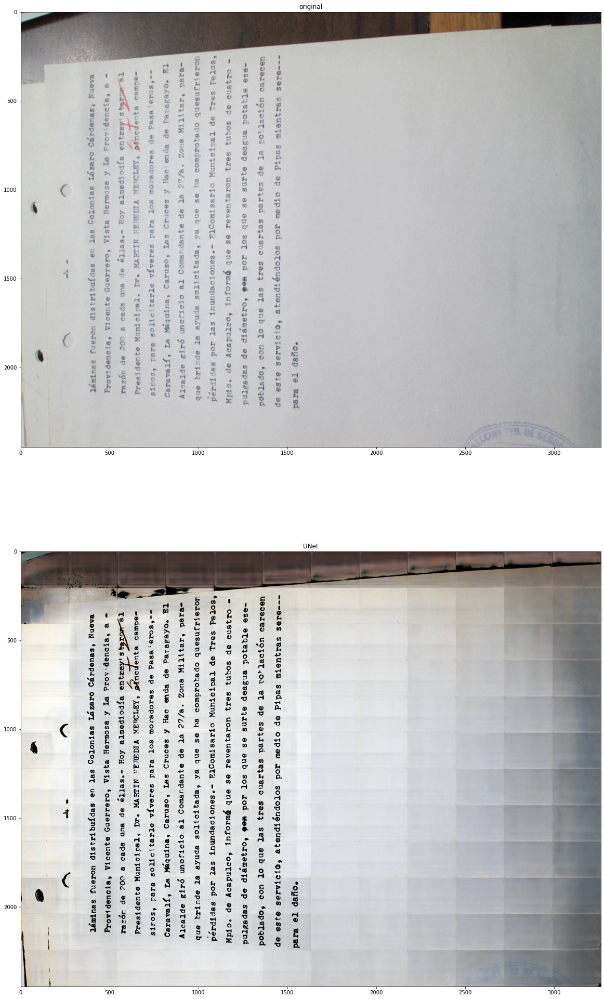

In [104]:
idx = 19
img1=Image.open(testing_path+'/'+test_fnames[idx])
endimg = process_image(img1,model,scale=1,k=0,contrast=conts[idx])
display_example(img1,endimg)


k chosen 16
Tile shape : (216, 288, 3)


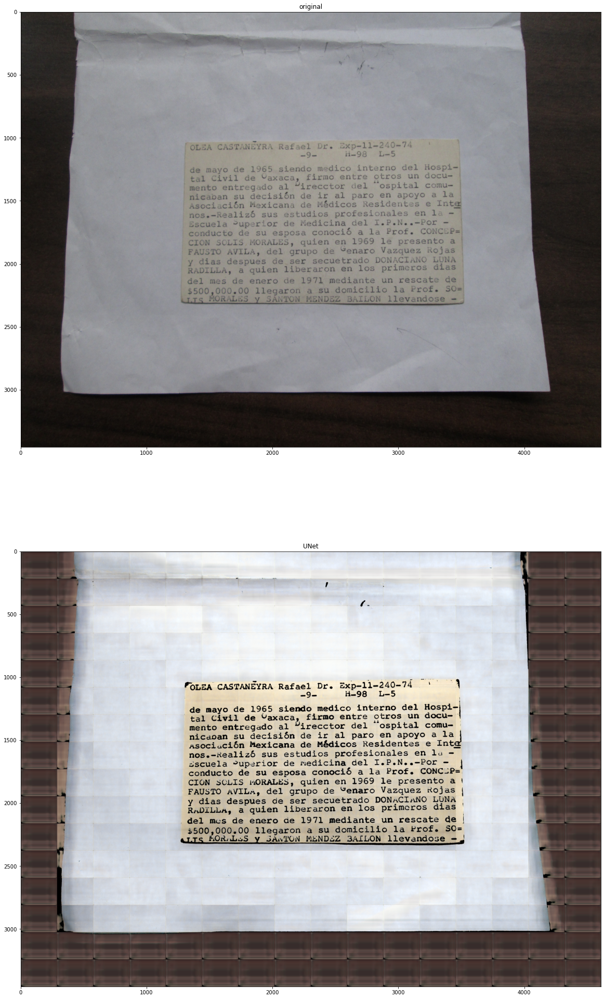

In [105]:
idx = 15
img1=Image.open(testing_path+'/'+test_fnames[idx])
endimg = process_image(img1,model,scale=1,k=0,contrast=conts[idx])
display_example(img1,endimg)

k chosen 12
Tile shape : (216, 288, 3)


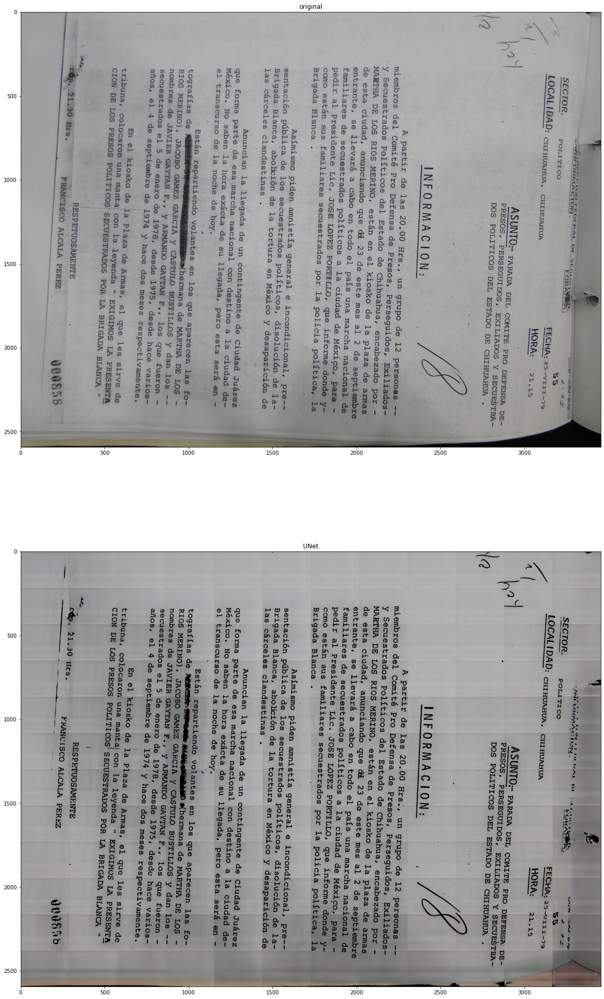

In [106]:
idx = 14
img1=Image.open(testing_path+'/'+test_fnames[idx])
endimg = process_image(img1,model,scale=1,k=0,contrast=conts[idx])
display_example(img1,endimg)

k chosen 8
Tile shape : (216, 288, 3)


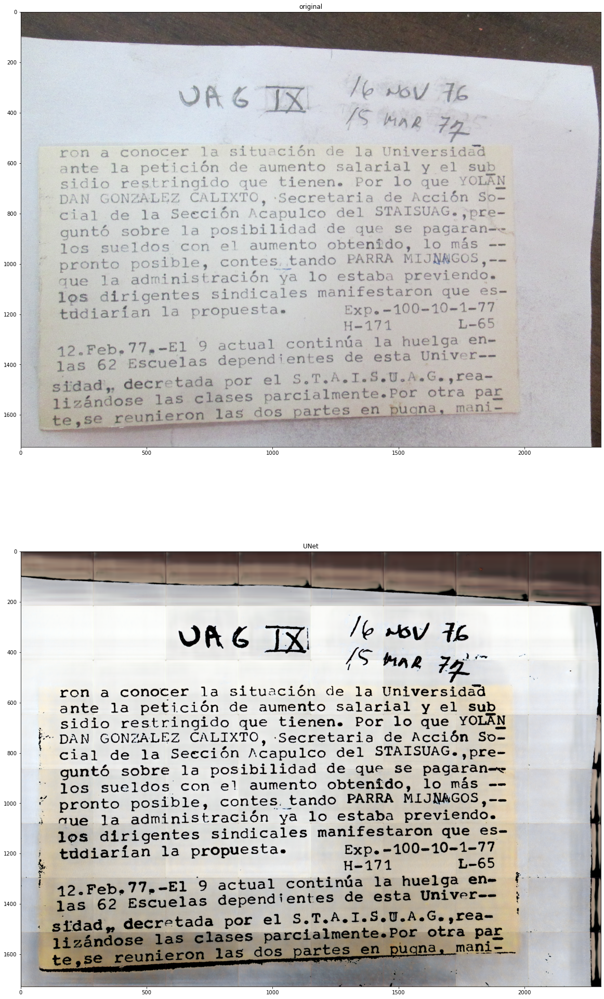

In [107]:
idx = 23
img1=Image.open(testing_path+'/'+test_fnames[idx])
endimg = process_image(img1,model,scale=1,k=0,contrast=conts[idx])
display_example(img1,endimg)

In [99]:
saving_path='data_riiaa/valEnhanced/'
import matplotlib.cm as cm
count = 0
for fname in test_fnames:
    img1=Image.open(testing_path+'/'+fname)
    endimg = process_image(img1,model,scale=1,k=0,contrast=conts[count])
    im = Image.fromarray(endimg)
    #ots = Image.fromarray(otsu)
    im.save(saving_path+fname)
    print(f'{fname} DONE')
    count +=1

k chosen 12
Tile shape : (216, 288, 3)
AGN_DFS_C.151_Morales_Lopez_Delia_pg-025.jpg DONE
k chosen 12
Tile shape : (216, 288, 3)
AGN_DFS_C.160_Murillo_de_Ramirez_Juventina_Martha_pg-002.jpg DONE
k chosen 12
Tile shape : (216, 288, 3)
AGN_DFS_C.160_Murillo_de_Ramirez_Juventina_Martha_pg-005.jpg DONE
k chosen 12
Tile shape : (216, 288, 3)
AGN_DFS_C.184_Tecla_Parra_Violeta_pg-014.jpg DONE
k chosen 12
Tile shape : (216, 288, 3)
AGN_DFS_C.189_Padilla_Rivera_Rebeca_pg-001.jpg DONE
k chosen 6
Tile shape : (180, 320, 3)
AGN_DFS_C.18_1_de_2_Cabrera_Arenas_Emma_pg-002.jpg DONE
k chosen 6
Tile shape : (180, 320, 3)
AGN_DFS_C.18_1_de_2_Cabrera_Arenas_Emma_pg-096.jpg DONE
k chosen 6
Tile shape : (180, 320, 3)
AGN_DFS_C.18_1_de_2_Cabrera_Arenas_Emma_pg-103.jpg DONE
k chosen 12
Tile shape : (216, 288, 3)
AGN_DFS_C.18_2_de_2_Cabrera_Arenas_Emma_pg-126.jpg DONE
k chosen 12
Tile shape : (216, 288, 3)
AGN_DFS_C.18_2_de_2_Cabrera_Arenas_Emma_pg-326.jpg DONE
k chosen 12
Tile shape : (216, 288, 3)
AGN_DFS_C.